## Hackathon Code 

In [187]:
# import libraries
import os 
import csv
import pandas as pd
from collections import Counter
import matplotlib.pyplot as plt
from PIL import Image
import glob
from PIL import ImageFile
from sklearn.cluster import KMeans
import transformers
from sentence_transformers import SentenceTransformer
from PIL import Image, UnidentifiedImageError
import sklearn
ImageFile.LOAD_TRUNCATED_IMAGES = True
import re
import random
from spellchecker import SpellChecker
import inflect


In [379]:
data_directory = "/home/trkosire/Factorynet/hackathon/data/"

file_formats = set()

for filename in os.listdir(data_directory):
    file_format = os.path.splitext(filename)[1].lower()
    file_formats.add(file_format)
for file_format in file_formats:
    print(f"File format: {file_format}")
num_file_formats = len(file_formats)
print(f"Number of different file formats in the directory: {num_file_formats}")

File format: .csv
File format: .png
Number of different file formats in the directory: 2


In [380]:
# convert all .csv# files to .csv
for filename in os.listdir(data_directory):
    if filename.lower().endswith(".csv#"):
        os.rename(data_directory + filename, data_directory + filename[:-1])

# convert all .gif, .webp, .svg, .jpg  to .png
for filename in os.listdir(data_directory):
    if filename.lower().endswith((".jpg", ".jpeg", ".png",".gif", ".webp", ".svg")):
        new_filename = os.path.splitext(filename)[0] + ".png"
        os.rename(os.path.join(data_directory, filename), os.path.join(data_directory, new_filename))

In [381]:
# process single file 
def process_csv(file_path):
    df = pd.read_csv(file_path, header=None)
    df.columns = ['label', 'x1', 'y1', 'height' , 'width', 'source']
    print(f"Processing file: {os.path.basename(file_path)}")
    print(f"Number of rows: {len(df)}")
    print("Labels found:")
    for label in df['label'].unique():
        print(f"  - {label}")
    print("\nDataset preview:")
    print(df)
    print("\n")
    
    return df
csv_file = "/home/trkosire/Factorynet/hackathon/data/1711552937516.csv"  
processed_data = process_csv(csv_file)

Processing file: 1711552937516.csv
Number of rows: 3
Labels found:
  - angle grinder
  - grinder
  - Metalworking

Dataset preview:
           label  x1  y1  height  width     source
0  angle grinder   0   0     605    907       user
1        grinder   0   0     605    907       user
2   Metalworking   0   0    3072   4608  wikimedia




In [382]:
# count the empty csv files
empty_csv_files = []    
for filename in os.listdir(data_directory):
    if filename.lower().endswith(".csv"):
        file_path = os.path.join(data_directory, filename)
        try:
            df = pd.read_csv(file_path, header=None)
        except pd.errors.EmptyDataError:
            empty_csv_files.append(file_path)
print(f"Number of empty CSV files: {len(empty_csv_files)}")

Number of empty CSV files: 0


## process all files

In [383]:
def process_csv(file_path, image_path):
    try:
        df = pd.read_csv(file_path, header=None)
        df.columns = ['label', 'x1', 'y1', 'height', 'width', 'source']
        df['file_name'] = os.path.basename(file_path).replace('.csv', '')
        return df
    except pd.errors.EmptyDataError:
        # delete the csv file and # image file if the csv file is empty
        os.remove(file_path)
        os.remove(image_path)


def process_all_csvs(directory):
    all_data = []
    csv_files = glob.glob(os.path.join(directory, '*.csv'))
    images_files = glob.glob(os.path.join(directory, '*.png'))
    
    # Create a dictionary to map base filenames to their corresponding image files
    image_dict = {os.path.splitext(os.path.basename(img))[0]: img for img in images_files}
    
    for csv_file in csv_files:
        base_name = os.path.splitext(os.path.basename(csv_file))[0]
        if base_name in image_dict:
            image_file = image_dict[base_name]
            df = process_csv(csv_file, image_file)
            all_data.append(df)
        else:
            print(f"No matching image found for CSV file: {csv_file}")

    combined_df = pd.concat(all_data, ignore_index=True)
    return combined_df

data_directory = "/home/trkosire/Factorynet/hackathon/data/"

combined_data = process_all_csvs(data_directory)


In [384]:
# chech for missing values
combined_data.isnull().sum() 
na_rows = combined_data[combined_data['label'].isna()]
print(na_rows) 

     label    x1     y1  height  width source      file_name
4597   NaN  34.0  685.0   589.0  614.0   user  1711583699212


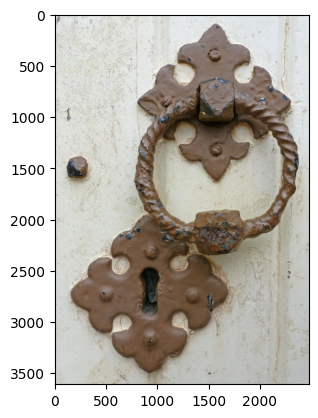

In [385]:
# display images
image_name = '1711583699212'
img =  Image.open(os.path.join(data_directory,  image_name + '.png'))
plt.imshow(img)


In [386]:
combined_data['label'] = combined_data['label'].fillna('Cast Iron Door Knocker')

In [387]:
#check the null values rows
combined_data.isnull().sum()
#printy the null values rows
na_rows = combined_data[combined_data['x1'].isna()]
print(na_rows)

                            label  x1  y1  height  width source      file_name
1480                     band saw NaN NaN     NaN    NaN   user  1711570441314
1481         metalworking bandsaw NaN NaN     NaN    NaN   user  1711570441314
5030                      milling NaN NaN     NaN    NaN   user  1711570711000
6053            motor screw shaft NaN NaN     NaN    NaN   user  1711593029467
7001                        train NaN NaN     NaN    NaN   user  1711619355276
8363                        flame NaN NaN     NaN    NaN   user  1711553374090
9960      human machine interface NaN NaN     NaN    NaN   user  1711570715860
10277                     toolkit NaN NaN     NaN    NaN   user  1711583362941
11741                    grinding NaN NaN     NaN    NaN   user  1711585889075
12420                       lathe NaN NaN     NaN    NaN   user  1711553571188
15900                       chain NaN NaN     NaN    NaN   user  1711572748504
15984                 metal parts NaN NaN     NaN   

In [388]:
# fill the nan values in columns x1, y1, height, width with 0
combined_data[['x1', 'y1', 'height', 'width']] = combined_data[['x1', 'y1', 'height', 'width']].fillna(0)


In [389]:
combined_data.isnull().sum()

label        0
x1           0
y1           0
height       0
width        0
source       0
file_name    0
dtype: int64

In [390]:
combined_data['label'] = combined_data['label'].str.lower()

In [391]:
# clean and normalize labels
def clean_text(text):
    text = text.lower()
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    return text.strip()

# clean_text("Cast5 Iron _ Door % Knocker")

combined_data['label'] = combined_data['label'].apply(clean_text)

In [392]:
spell = SpellChecker()

def correct_spelling(text):
    corrected_text = []
    for word in text.split():
        correction = spell.correction(word)
        if correction is None:
            correction = word  
        corrected_text.append(correction)
    return ' '.join(corrected_text)

# Apply spell checker to the labels in the combined data
combined_data['label'] = combined_data['label'].apply(correct_spelling)

In [393]:


p = inflect.engine()

def inflect_text(text):
    singularized_text = []
    for word in text.split():  
        singular_form = p.singular_noun(word)
        if singular_form:  
            singularized_text.append(singular_form)
        else:
            singularized_text.append(word)  
    return ' '.join(singularized_text)

# Apply the inflect_text function to each label in the combined_data
combined_data['label'] = combined_data['label'].apply(inflect_text)


In [395]:
combined_data.to_csv("final_data_exploration.csv", index=False)

## done pre processing 


In [396]:
label_counts = combined_data['label'].value_counts().reset_index()
label_counts.columns = ['label', 'count']
label_counts.to_csv('final_label_analysis_results.csv', index=False)

In [415]:
# don't show the warning
import warnings
warnings.filterwarnings("ignore")

model = SentenceTransformer('all-MiniLM-L6-v2')
label_embeddings = model.encode(combined_data['label'].unique().tolist())

max_clusters = 300
all_silhouette_scores = []
for num_clusters in range(2, max_clusters + 1) :
    kmeans = KMeans(n_clusters=num_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(label_embeddings)
    silhouette_sc = sklearn.metrics.silhouette_score(label_embeddings, cluster_labels)
    all_silhouette_scores.append(silhouette_sc)

optimal_clusters = all_silhouette_scores.index(max(all_silhouette_scores)) + 2

kmeans = KMeans(n_clusters=optimal_clusters, random_state=42, n_init=10)
cluster_labels = kmeans.fit_predict(label_embeddings)

label_to_cluster = {label: cluster for label, cluster in zip(combined_data['label'].unique(), cluster_labels)}
combined_data[f'optimal_clusters_{optimal_clusters}'] = combined_data['label'].map(label_to_cluster)


In [419]:
optimal_clusters

289

In [421]:
max(all_silhouette_scores)

0.094253965

In [ ]:

# Get the unique cluster labels
unique_clusters = combined_data['label_cluster'].unique()

# Create an empty dict  to store the random values with the cluster labels as keys
random_values = {}

# Iterate over each cluster label
for cluster_label in unique_clusters:
    # Get all the rows with the current cluster label
    cluster_rows = combined_data[combined_data['label_cluster'] == cluster_label]
    
    # Take a random value from the cluster rows
    random_row = cluster_rows.sample(n=1)
    
    # Get the value from the 'label' column of the random row
    random_value = random_row['label'].values[0]
    
    # Append the random value to the list
    random_values[cluster_label] = random_value

# Apply clustering on the random values list
random_values_embeddings = model.encode(list(random_values.values()))
max_clusters = optimal_clusters // 2
all_random_silhouette_scores = []
for num_clusters in range(2, max_clusters + 1) :
    kmeans = KMeans(n_clusters=num_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(random_values_embeddings)
    silhouette_sc = sklearn.metrics.silhouette_score(random_values_embeddings, cluster_labels)
    all_random_silhouette_scores.append(silhouette_sc)

random_optimal_clusters = all_random_silhouette_scores.index(max(all_random_silhouette_scores)) + 2

kmeans = KMeans(n_clusters=random_optimal_clusters, random_state=42)
random_luster_labels = kmeans.fit_predict(random_values_embeddings)
random_label_to_cluster = {label: cluster for label, cluster in zip(random_values.keys(), random_luster_labels)}
combined_data['random_label_cluster'] = combined_data['label_cluster'].map(random_label_to_cluster)




In [ ]:
# once more do the clustering on the random label clusters
# Get the unique cluster labels
unique_clusters = combined_data['random_label_cluster'].unique()

# Create an empty dict  to store the random values with the cluster labels as keys
random_values = {}

# Iterate over each cluster label
for cluster_label in unique_clusters:
    # Get all the rows with the current cluster label
    cluster_rows = combined_data[combined_data['random_label_cluster'] == cluster_label]
    
    # Take a random value from the cluster rows
    random_row = cluster_rows.sample(n=1)
    
    # Get the value from the 'label' column of the random row
    random_value = random_row['label'].values[0]
    
    # Append the random value to the list
    random_values[cluster_label] = random_value

# Apply clustering on the random values list
random_values_embeddings = model.encode(list(random_values.values()))
max_clusters = random_optimal_clusters // 2
all_random_silhouette_scores = []
for num_clusters in range(2, max_clusters + 1) :
    kmeans = KMeans(n_clusters=num_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(random_values_embeddings)
    silhouette_sc = sklearn.metrics.silhouette_score(random_values_embeddings, cluster_labels)
    all_random_silhouette_scores.append(silhouette_sc)

random_optimal_clusters = all_random_silhouette_scores.index(max(all_random_silhouette_scores)) + 2

kmeans = KMeans(n_clusters=random_optimal_clusters, random_state=42)
random_luster_labels = kmeans.fit_predict(random_values_embeddings)
random_label_to_cluster = {label: cluster for label, cluster in zip(random_values.keys(), random_luster_labels)}
combined_data['random_random_label_cluster'] = combined_data['random_label_cluster'].map(random_label_to_cluster)



In [214]:
# count number of labels in each cluster
cluster_counts = combined_data['label_cluster'].value_counts().reset_index()
cluster_counts.columns = ['cluster', 'count']
cluster_counts.to_csv('cluster_analysis_results.csv', index=False)

for cluster, count in zip(cluster_counts['cluster'],cluster_counts['count']):
    print(f"Cluster {cluster}: {count} labels")

Cluster 29: 1433 labels
Cluster 1: 930 labels
Cluster 20: 881 labels
Cluster 67: 776 labels
Cluster 50: 636 labels
Cluster 45: 610 labels
Cluster 43: 609 labels
Cluster 28: 604 labels
Cluster 4: 563 labels
Cluster 18: 557 labels
Cluster 77: 551 labels
Cluster 8: 536 labels
Cluster 42: 535 labels
Cluster 2: 513 labels
Cluster 13: 471 labels
Cluster 51: 435 labels
Cluster 41: 402 labels
Cluster 36: 392 labels
Cluster 59: 378 labels
Cluster 9: 377 labels
Cluster 34: 373 labels
Cluster 65: 365 labels
Cluster 37: 363 labels
Cluster 0: 358 labels
Cluster 31: 347 labels
Cluster 17: 336 labels
Cluster 71: 335 labels
Cluster 32: 325 labels
Cluster 49: 325 labels
Cluster 40: 279 labels
Cluster 57: 275 labels
Cluster 44: 264 labels
Cluster 5: 248 labels
Cluster 72: 247 labels
Cluster 16: 241 labels
Cluster 38: 239 labels
Cluster 64: 230 labels
Cluster 14: 230 labels
Cluster 52: 227 labels
Cluster 19: 227 labels
Cluster 60: 225 labels
Cluster 6: 221 labels
Cluster 63: 220 labels
Cluster 73: 213 la

In [275]:
for label, cluster in label_to_cluster.items():
        print(f"Label: {label} - Cluster: {cluster}")

Label: railway grinding machine - Cluster: 45
Label: rail grinder - Cluster: 45
Label: rail grinder with worker - Cluster: 45
Label: railway grinding machine with worker - Cluster: 45
Label: worker - Cluster: 62
Label: railgrinders of the united states - Cluster: 44
Label: ceramic mold - Cluster: 66
Label: casting moulds - Cluster: 66
Label: feeler gage - Cluster: 22
Label: feeler gauge - Cluster: 22
Label: feeler gauges - Cluster: 22
Label: milling machine - Cluster: 34
Label: computer numerical control - Cluster: 38
Label: printing press - Cluster: 49
Label: marinonis rotary press  cnam - Cluster: 57
Label: hand drill - Cluster: 67
Label: wood drills - Cluster: 67
Label: desk - Cluster: 20
Label: work desk - Cluster: 62
Label: table - Cluster: 64
Label: work station - Cluster: 62
Label: bottle - Cluster: 74
Label: paint bottle - Cluster: 74
Label: ear muffs - Cluster: 63
Label: hearing protector - Cluster: 63
Label: light - Cluster: 77
Label: lamp - Cluster: 77
Label: desk lamp - Clu

In [274]:

# Get the unique cluster labels
unique_clusters = combined_data['label_cluster'].unique()

# Create an empty dict  to store the random values with the cluster labels as keys
random_values = {}

# Iterate over each cluster label
for cluster_label in unique_clusters:
    # Get all the rows with the current cluster label
    cluster_rows = combined_data[combined_data['label_cluster'] == cluster_label]
    
    # Take a random value from the cluster rows
    random_row = cluster_rows.sample(n=1)
    
    # Get the value from the 'label' column of the random row
    random_value = random_row['label'].values[0]
    
    # Append the random value to the list
    random_values[cluster_label] = random_value

# Apply clustering on the random values list
random_values_embeddings = model.encode(list(random_values.values()))
max_clusters = 40
all_random_silhouette_scores = []
for num_clusters in range(2, max_clusters + 1) :
    kmeans = KMeans(n_clusters=num_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(random_values_embeddings)
    silhouette_sc = sklearn.metrics.silhouette_score(random_values_embeddings, cluster_labels)
    all_random_silhouette_scores.append(silhouette_sc)

random_optimal_clusters = all_random_silhouette_scores.index(max(all_random_silhouette_scores)) + 2

kmeans = KMeans(n_clusters=random_optimal_clusters, random_state=42)
random_luster_labels = kmeans.fit_predict(random_values_embeddings)
random_label_to_cluster = {label: cluster for label, cluster in zip(random_values.keys(), random_luster_labels)}
combined_data['random_label_cluster'] = combined_data['label_cluster'].map(random_label_to_cluster)

print(f"Optimal number of clusters for random values: {random_optimal_clusters}")
print(combined_data[['label', 'label_cluster', 'random_label_cluster']].head(10))



Optimal number of clusters for random values: 39
                                  label  label_cluster  random_label_cluster
0              railway grinding machine             45                     2
1                          rail grinder             45                     2
2              rail grinder with worker             45                     2
3  railway grinding machine with worker             45                     2
4                                worker             62                    37
5     railgrinders of the united states             44                    13
6                          ceramic mold             66                    15
7                        casting moulds             66                    15
8                           feeler gage             22                    30
9                          feeler gauge             22                    30


In [422]:
combined_data = pd.read_csv("data_exploration.csv")

In [423]:
# match the random values to the original labels and print the label the first cluster and the random cluster
for label, cluster, random_cluster in zip(combined_data['label'], combined_data['label_cluster'], combined_data['random_label_cluster']):
    print(f"Label: {label} - Cluster: {cluster} - Random Cluster: {random_cluster}")


Label: railway grinding machine - Cluster: 45 - Random Cluster: 2
Label: rail grinder - Cluster: 45 - Random Cluster: 2
Label: rail grinder with worker - Cluster: 45 - Random Cluster: 2
Label: railway grinding machine with worker - Cluster: 45 - Random Cluster: 2
Label: worker - Cluster: 62 - Random Cluster: 37
Label: railgrinders of the united states - Cluster: 44 - Random Cluster: 13
Label: ceramic mold - Cluster: 66 - Random Cluster: 15
Label: casting moulds - Cluster: 66 - Random Cluster: 15
Label: feeler gage - Cluster: 22 - Random Cluster: 30
Label: feeler gauge - Cluster: 22 - Random Cluster: 30
Label: feeler gauges - Cluster: 22 - Random Cluster: 30
Label: milling machine - Cluster: 34 - Random Cluster: 36
Label: computer numerical control - Cluster: 38 - Random Cluster: 19
Label: printing press - Cluster: 49 - Random Cluster: 16
Label: marinonis rotary press  cnam - Cluster: 57 - Random Cluster: 16
Label: hand drill - Cluster: 67 - Random Cluster: 1
Label: wood drills - Cluste

In [ ]:
# once more do the clustering on the random label clusters
# Get the unique cluster labels
unique_clusters = combined_data['random_label_cluster'].unique()

# Create an empty dict  to store the random values with the cluster labels as keys
random_values = {}

# Iterate over each cluster label
for cluster_label in unique_clusters:
    # Get all the rows with the current cluster label
    cluster_rows = combined_data[combined_data['random_label_cluster'] == cluster_label]
    
    # Take a random value from the cluster rows
    random_row = cluster_rows.sample(n=1)
    
    # Get the value from the 'label' column of the random row
    random_value = random_row['label'].values[0]
    
    # Append the random value to the list
    random_values[cluster_label] = random_value

# Apply clustering on the random values list
random_values_embeddings = model.encode(list(random_values.values()))
max_clusters = 20
all_random_silhouette_scores = []
for num_clusters in range(2, max_clusters + 1) :
    kmeans = KMeans(n_clusters=num_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(random_values_embeddings)
    silhouette_sc = sklearn.metrics.silhouette_score(random_values_embeddings, cluster_labels)
    all_random_silhouette_scores.append(silhouette_sc)

random_optimal_clusters = all_random_silhouette_scores.index(max(all_random_silhouette_scores)) + 2

kmeans = KMeans(n_clusters=random_optimal_clusters, random_state=42)
random_luster_labels = kmeans.fit_predict(random_values_embeddings)
random_label_to_cluster = {label: cluster for label, cluster in zip(random_values.keys(), random_luster_labels)}
combined_data['random_random_label_cluster'] = combined_data['random_label_cluster'].map(random_label_to_cluster)

print(f"Optimal number of clusters for random values: {random_optimal_clusters}")
print(combined_data[['label', 'label_cluster', 'random_label_cluster', 'random_random_label_cluster']].head(10))

In [278]:
# match the random values to the original labels and print the label the first cluster and the random cluster and the random random cluster
for label, cluster, random_cluster, random_random_cluster in zip(combined_data['label'], combined_data['label_cluster'], combined_data['random_label_cluster'], combined_data['random_random_label_cluster']):
    print(f"Label: {label} - Cluster: {cluster} - Random Cluster: {random_cluster} - Random Random Cluster: {random_random_cluster}")


Label: railway grinding machine - Cluster: 45 - Random Cluster: 2 - Random Random Cluster: 9
Label: rail grinder - Cluster: 45 - Random Cluster: 2 - Random Random Cluster: 9
Label: rail grinder with worker - Cluster: 45 - Random Cluster: 2 - Random Random Cluster: 9
Label: railway grinding machine with worker - Cluster: 45 - Random Cluster: 2 - Random Random Cluster: 9
Label: worker - Cluster: 62 - Random Cluster: 37 - Random Random Cluster: 15
Label: railgrinders of the united states - Cluster: 44 - Random Cluster: 13 - Random Random Cluster: 9
Label: ceramic mold - Cluster: 66 - Random Cluster: 15 - Random Random Cluster: 12
Label: casting moulds - Cluster: 66 - Random Cluster: 15 - Random Random Cluster: 12
Label: feeler gage - Cluster: 22 - Random Cluster: 30 - Random Random Cluster: 1
Label: feeler gauge - Cluster: 22 - Random Cluster: 30 - Random Random Cluster: 1
Label: feeler gauges - Cluster: 22 - Random Cluster: 30 - Random Random Cluster: 1
Label: milling machine - Cluster: 

In [ ]:
# once more do the clustering on the random label clusters
# Get the unique cluster labels
unique_clusters = combined_data['random_random_label_cluster'].unique()

# Create an empty dict  to store the random values with the cluster labels as keys
random_values = {}

# Iterate over each cluster label
for cluster_label in unique_clusters:
    # Get all the rows with the current cluster label
    cluster_rows = combined_data[combined_data['random_random_label_cluster'] == cluster_label]
    
    # Take a random value from the cluster rows
    random_row = cluster_rows.sample(n=1)
    
    # Get the value from the 'label' column of the random row
    random_value = random_row['label'].values[0]
    
    # Append the random value to the list
    random_values[cluster_label] = random_value

# Apply clustering on the random values list
random_values_embeddings = model.encode(list(random_values.values()))
max_clusters = 10
all_random_silhouette_scores = []
for num_clusters in range(2, max_clusters + 1) :
    kmeans = KMeans(n_clusters=num_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(random_values_embeddings)
    silhouette_sc = sklearn.metrics.silhouette_score(random_values_embeddings, cluster_labels)
    all_random_silhouette_scores.append(silhouette_sc)

random_optimal_clusters = all_random_silhouette_scores.index(max(all_random_silhouette_scores)) + 2

kmeans = KMeans(n_clusters=random_optimal_clusters, random_state=42)
random_luster_labels = kmeans.fit_predict(random_values_embeddings)
random_label_to_cluster = {label: cluster for label, cluster in zip(random_values.keys(), random_luster_labels)}
combined_data['random_random_random_label_cluster'] = combined_data['random_random_label_cluster'].map(random_label_to_cluster)

print(f"Optimal number of clusters for random values: {random_optimal_clusters}")
print(combined_data[['label', 'label_cluster', 'random_label_cluster', 'random_random_label_cluster','random_random_random_label_cluster']].head(10))

In [424]:
## match the random values to the original labels and print the label the first cluster and the random cluster and the random random cluster and the random random random cluster
for label, cluster, random_cluster, random_random_cluster, random_random_random_cluster in zip(combined_data['label'], combined_data['label_cluster'], combined_data['random_label_cluster'], combined_data['random_random_label_cluster'], combined_data['random_random_random_label_cluster']):
    print(f"Label: {label} - Cluster: {cluster} - Random Cluster: {random_cluster} - Random Random Cluster: {random_random_cluster} - Random Random Random Cluster: {random_random_random_cluster}")


Label: railway grinding machine - Cluster: 45 - Random Cluster: 2 - Random Random Cluster: 9 - Random Random Random Cluster: 5
Label: rail grinder - Cluster: 45 - Random Cluster: 2 - Random Random Cluster: 9 - Random Random Random Cluster: 5
Label: rail grinder with worker - Cluster: 45 - Random Cluster: 2 - Random Random Cluster: 9 - Random Random Random Cluster: 5
Label: railway grinding machine with worker - Cluster: 45 - Random Cluster: 2 - Random Random Cluster: 9 - Random Random Random Cluster: 5
Label: worker - Cluster: 62 - Random Cluster: 37 - Random Random Cluster: 15 - Random Random Random Cluster: 0
Label: railgrinders of the united states - Cluster: 44 - Random Cluster: 13 - Random Random Cluster: 9 - Random Random Random Cluster: 5
Label: ceramic mold - Cluster: 66 - Random Cluster: 15 - Random Random Cluster: 12 - Random Random Random Cluster: 1
Label: casting moulds - Cluster: 66 - Random Cluster: 15 - Random Random Cluster: 12 - Random Random Random Cluster: 1
Label: f

In [432]:
combined_data[combined_data['label'].str.contains('worker')]

,label,x1,y1,height,width,source,file_name,label_cluster,random_label_cluster,random_random_label_cluster,random_random_random_label_cluster,count_of_label
2,rail grinder with worker,0.0,0.0,720.0,720.0,user,1711591656377,45,2,9,5,1
3,railway grinding machine with worker,0.0,0.0,720.0,720.0,user,1711591656377,45,2,9,5,1
4,worker,0.0,0.0,720.0,720.0,user,1711591656377,62,37,15,0,36
249,worker weld on barrels,0.0,0.0,801.0,769.0,user,1711553855168,29,4,19,2,1
993,factory worker,0.0,0.0,603.0,907.0,user,1711576328226,62,37,15,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...
23147,worker with mig weld and workpiece,0.0,0.0,577.0,907.0,user,1711553987069,29,4,19,2,1
23149,worker with weld mask,0.0,14.0,350.0,707.0,user,1711553987069,29,4,19,2,7
23211,workers at workbench with workpiece,0.0,0.0,820.0,524.0,user,1711587617371,26,37,2,5,1
23282,workers,0.0,0.0,457.0,610.0,user,1711567521057,62,37,15,0,5


In [346]:
cluster_zero = combined_data[combined_data['random_random_random_label_cluster'] == 0]
cluster_one = combined_data[combined_data['random_random_random_label_cluster'] == 1]
cluster_two = combined_data[combined_data['random_random_random_label_cluster'] == 2]
cluster_three = combined_data[combined_data['random_random_random_label_cluster'] == 3]
cluster_four = combined_data[combined_data['random_random_random_label_cluster'] == 4]
cluster_five = combined_data[combined_data['random_random_random_label_cluster'] == 5]


In [347]:
# count how many times each label appears in the cluster zero and create a new column with the count in the cluster zero dataframe
cluster_zero_counts = cluster_zero['label'].value_counts().reset_index()
cluster_zero_counts.columns = ['label', 'count_of_label']
cluster_zero = cluster_zero.merge(cluster_zero_counts, on='label', how='left')

# sort the dataframe by the count of the label in the cluster zero
cluster_zero = cluster_zero.sort_values(by='count_of_label', ascending=False)


In [378]:
combined_data['label'].value_counts()

label
scissors                        303
saw                             241
chainsaw                        228
welder                          216
screw                           208
                               ... 
vintage electronic                1
wiring device                     1
connection box                    1
electrical terminal               1
portable mini soldering iron      1
Name: count, Length: 5790, dtype: int64

In [354]:
combined_data['count_of_label'] = combined_data['label'].map(combined_data['label'].value_counts())

In [ ]:
from collections import defaultdict

# Create a dictionary to store the clusters and their corresponding labels
cluster_dict = defaultdict(list)

# Iterate through the DataFrame and populate the dictionary
for _, row in combined_data.iterrows():
    label = row['label']
    cluster = row['label_cluster']
    random_cluster = row['random_label_cluster']
    random_random_cluster = row['random_random_label_cluster']
    random_random_random_cluster = row['random_random_random_label_cluster']
    
    cluster_dict[(cluster, random_cluster, random_random_cluster, random_random_random_cluster)].append(label)

# Filter and print clusters where all labels belong to the same cluster across all columns
for clusters, labels in cluster_dict.items():
    if len(labels) > 1:
        print(f"Cluster Group: {clusters}")
        for label in labels:
            print(f"  Label: {label}")

In [358]:
len(cluster_dict)

80

In [344]:
cluster_zero[cluster_zero['count_of_label'] > 10]

,label,x1,y1,height,width,source,file_name,label_cluster,random_label_cluster,random_random_label_cluster,random_random_random_label_cluster,count_of_label
0,worker,0.0,0.0,720.0,720.0,user,1711591656377,62,37,15,0,36
9,sander,63.0,23.0,488.0,525.0,user,1711569846804,25,22,10,0,17
12,excavator,0.0,210.0,149.0,85.0,user,1711597006753,47,1,10,0,53
14,press,6.0,31.0,619.0,901.0,user,1711601177092,57,16,0,0,52
16,anvil,152.0,290.0,191.0,226.0,user,1711590076322,60,12,16,0,86
...,...,...,...,...,...,...,...,...,...,...,...,...
2376,work gloves,360.0,234.0,61.0,72.0,user,1711568566190,62,37,15,0,35
2378,presses,0.0,0.0,4821.0,4622.0,wikimedia,1711576171942,57,16,0,0,12
2379,worker,0.0,0.0,577.0,907.0,user,1711553987069,62,37,15,0,36
2387,excavator,736.0,385.0,121.0,171.0,user,1711596996715,47,1,10,0,53


In [315]:
cluster_one[cluster_one['label'].str.contains('drills')]

,label,x1,y1,height,width,source,file_name,label_cluster,random_label_cluster,random_random_label_cluster,random_random_random_label_cluster
16,wood drills,0.0,0.0,2527.0,681.0,wikimedia,1711585624724,67,1,7,1
89,hand drills,402.0,60.0,332.0,187.0,user,1711599800132,67,1,7,1
235,corded electric drills,0.0,0.0,3456.0,4608.0,wikimedia,1711597555984,67,1,7,1
239,handpowered drills,0.0,0.0,1400.0,3648.0,wikimedia,1711585544106,67,1,7,1
402,spiral drills,0.0,0.0,1536.0,2048.0,wikimedia,1711597248086,67,1,7,1
...,...,...,...,...,...,...,...,...,...,...,...
22938,drills,0.0,0.0,3888.0,2592.0,wikimedia,1711574481954,67,1,7,1
22988,bench pillar drills,0.0,0.0,1479.0,924.0,wikimedia,1711586454516,67,1,7,1
23100,makita cordless drills,0.0,0.0,1200.0,1600.0,wikimedia,1711598130592,67,1,7,1
23106,makita cordless drills,0.0,0.0,2128.0,4608.0,wikimedia,1711598137241,67,1,7,1


In [306]:
# length of each cluster in random random random cluster
cluster_counts = combined_data['random_random_random_label_cluster'].value_counts().reset_index()

cluster_counts


,random_random_random_label_cluster,count
0,1,9483
1,5,5580
2,2,3751
3,0,2395
4,4,1291
5,3,801


In [313]:
combined_data[combined_data['label'].str.contains('drills')]

,label,x1,y1,height,width,source,file_name,label_cluster,random_label_cluster,random_random_label_cluster,random_random_random_label_cluster
16,wood drills,0.0,0.0,2527.0,681.0,wikimedia,1711585624724,67,1,7,1
89,hand drills,402.0,60.0,332.0,187.0,user,1711599800132,67,1,7,1
235,corded electric drills,0.0,0.0,3456.0,4608.0,wikimedia,1711597555984,67,1,7,1
239,handpowered drills,0.0,0.0,1400.0,3648.0,wikimedia,1711585544106,67,1,7,1
402,spiral drills,0.0,0.0,1536.0,2048.0,wikimedia,1711597248086,67,1,7,1
...,...,...,...,...,...,...,...,...,...,...,...
22938,drills,0.0,0.0,3888.0,2592.0,wikimedia,1711574481954,67,1,7,1
22988,bench pillar drills,0.0,0.0,1479.0,924.0,wikimedia,1711586454516,67,1,7,1
23100,makita cordless drills,0.0,0.0,1200.0,1600.0,wikimedia,1711598130592,67,1,7,1
23106,makita cordless drills,0.0,0.0,2128.0,4608.0,wikimedia,1711598137241,67,1,7,1


In [309]:
combined_data[combined_data['random_random_random_label_cluster'] == 1]

,label,x1,y1,height,width,source,file_name,label_cluster,random_label_cluster,random_random_label_cluster,random_random_random_label_cluster
6,ceramic mold,271.0,102.0,596.0,533.0,user,1711566520908,66,15,12,1
7,casting moulds,0.0,0.0,3456.0,4320.0,wikimedia,1711566520908,66,15,12,1
15,hand drill,0.0,0.0,2527.0,681.0,user,1711585624724,67,1,7,1
16,wood drills,0.0,0.0,2527.0,681.0,wikimedia,1711585624724,67,1,7,1
24,ear muffs,31.0,416.0,127.0,171.0,user,1711571869821,63,2,8,1
...,...,...,...,...,...,...,...,...,...,...,...
23286,excavation,0.0,0.0,457.0,610.0,user,1711567521057,2,1,7,1
23288,drilling,0.0,0.0,1944.0,2592.0,wikimedia,1711567521057,2,1,7,1
23297,rail clamp,0.0,0.0,605.0,907.0,user,1711581093292,36,9,7,1
23299,drill bit,0.0,0.0,651.0,907.0,user,1711566352395,41,1,7,1


In [289]:
# combine all labels as one string and find unique words
all_labels = ' '.join(combined_data['label'])
all_words = all_labels.split()
unique_words = set(all_words)
print(f"Number of unique words: {len(unique_words)}")
print(unique_words)

Number of unique words: 3552
{'squares', 'staple', 'ibm', 'routers', 'copping', 'breaker', 'action', 'masonary', 'insulating', 'electrical', 'rh', 'feed', 'fratelli', 'support', 'injection', 'cutquik', 'twohorned', 'piccolo', 'attachment', 'juice', 'rhtische', 'without', 'ibeams', 'cobot', 'boat', 'maillons', 'knurled', 'abbruch', 'photo', 'iran', 'patterns', 'string', 'schrottkokillen', 'hinger', 'tumbler', 'arrowhead', 'circle', 'spanish', 'teach', 'channellock', 'apple', 'sink', 'replica', 'underground', 'livery', 'confocal', 'fanuc', 'area', 'armley', 'jaws', 'exhibition', 'leg', 'ivp', 'industry', 'cage', 'miniware', 'setup', 'rings', 'banjo', 'alseuse', 'markings', 'too', 'treat', 'linerlock', 'firewood', 'ball', 'guitar', 'tower', 'came', 'grape', 'landschaftspark', 'pva', 'basket', 'tricoord', 'other', 'pipe', 'rule', 'crankshaft', 'mm', 'zip', 'treelion', 'highspeed', 'trains', 'monitoring', 'clasps', 'colors', 'driven', 'moulds', 'fabrikker', 'miller', 'smooth', 'krs', 'hallm

In [ ]:
all_words

In [ ]:
# perform clustering on the unique words
unique_words_embeddings = model.encode(list(unique_words))
max_clusters = 100
all_unique_silhouette_scores = []
for num_clusters in range(2, max_clusters + 1) :
    kmeans = KMeans(n_clusters=num_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(unique_words_embeddings)
    silhouette_sc = sklearn.metrics.silhouette_score(unique_words_embeddings, cluster_labels)
    all_unique_silhouette_scores.append(silhouette_sc)

unique_optimal_clusters = all_unique_silhouette_scores.index(max(all_unique_silhouette_scores)) + 2

kmeans = KMeans(n_clusters=unique_optimal_clusters, random_state=42, n_init = 10)
unique_cluster_labels = kmeans.fit_predict(unique_words_embeddings)

unique_word_to_cluster = {word: cluster for word, cluster in zip(unique_words, unique_cluster_labels)}

print(f"Optimal number of clusters for unique words: {unique_optimal_clusters}")
print(unique_word_to_cluster)


In [296]:
# perform hierarchical clustering on the unique words
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.spatial.distance import pdist

distance_matrix = pdist(unique_words_embeddings)
linkage_matrix = linkage(distance_matrix, method='ward')

plt.figure(figsize=(100, 100))
dendrogram(linkage_matrix)
plt.show()



Community 1: ['energysaving bulb', 'energyefficient bulb']
Community 2: ['foot pedal', 'pedal']
Community 3: ['overseer so stump cutter', 'overseer so stump grinder']
Community 4: ['hydraulic log splitter', 'hydraulic wood splitter']
Community 5: ['safety gear', 'safety equipment', 'personal protective equipment']
Community 6: ['cordles screwdriver', 'botch cordles screwdriver']
Community 7: ['staple', 'stapler', 'staple sheet', 'paper staple', 'box of staple', 'pack of staple', 'staple gun', 'staple clip', 'package of staple', 'metal staple', 'staple fastener']
Community 8: ['to hand lift pallet jack', 'hand lift pallet jack']
Community 9: ['crucible on crane with worker', 'crucible on crane in factory', 'crucible on crane']
Community 10: ['my hollow steel punch', 'dogotul hollow steel punch', 'dogotul my hollow steel punch', 'hollow steel punch']
Community 11: ['refill staple', 'staple refill stick']
Community 12: ['fork lift', 'forklift', 'forklift with load', 'reach forklift']
Comm

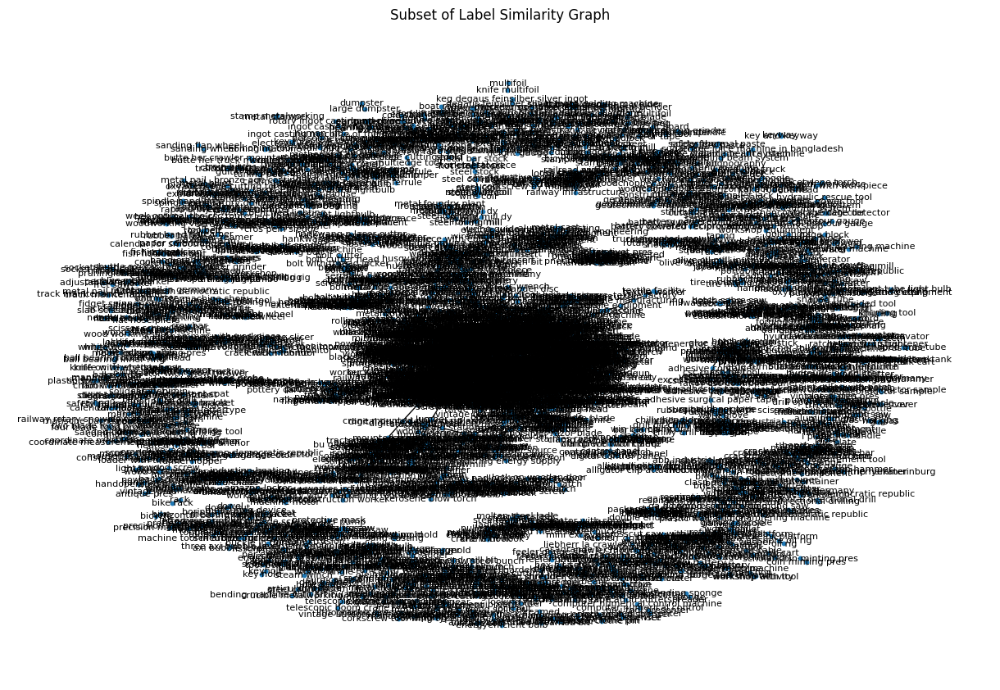

                                  label  label_community
0              railway grinding machine            170.0
1                          rail grinder            170.0
2              rail grinder with worker            170.0
3  railway grinding machine with worker            170.0
4                                worker            183.0
5     railgrinders of the united states              NaN
6                          ceramic mold              NaN
7                        casting moulds              NaN
8                           feeler gage             53.0
9                          feeler gauge             53.0


In [433]:
#approach was to create a graph where each string will be a node and each edge will connect two nodes with weight the similarity of those two strings.
#  You can use edit distance or Sorensen for that. I also set a threshold of 0.2 so that my graph will not be complete thus very computationally heavy.
#  After forming the graph you can use community detection algorithms to detect node communities. Each community is formed with nodes that have a lot of edges with each other, 
# so they will be very similar with each other. You can use networkx or igraph to form the graph and identify each community. So each community will be a cluster of strings. 
# I tested this approach with some string that I wanted to cluster. Here are some of the identified clusters.

import networkx as nx
from networkx.algorithms import community
import numpy as np
from sentence_transformers import SentenceTransformer
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt

def similarity(s1, s2, model):
    embeddings = model.encode([s1, s2])
    return cosine_similarity([embeddings[0]], [embeddings[1]])[0][0]

def create_graph(strings, threshold, model):
    G = nx.Graph()
    embeddings = model.encode(strings)
    similarities = cosine_similarity(embeddings)
    for i in range(len(strings)):
        for j in range(i+1, len(strings)):
            if similarities[i][j] > threshold:
                G.add_edge(strings[i], strings[j], weight=similarities[i][j])
    return G

def get_communities(G):
    return community.louvain_communities(G)


df  = pd.read_csv("final_data_exploration.csv")
df['label'] = df['label'].str.lower()
df['label'] = df['label'].apply(clean_text)
df['label'] = df['label'].apply(correct_spelling)
df['label'] = df['label'].apply(inflect_text)
unique_words = set(df['label'].unique().tolist())
# strings = combined_data['label'].unique().tolist()
strings = list(unique_words)
G = create_graph(strings, 0.8, model)  # Increased threshold for stricter similarity
communities = get_communities(G)

for i, comm in enumerate(communities):
    print(f"Community {i+1}: {list(comm)}")  # Print first 5 members of each community

# Create a dictionary to map each label to its corresponding community
label_to_community = {}
for i, comm in enumerate(communities):
    for label in comm:
        label_to_community[label] = i

combined_data['label_community'] = combined_data['label'].map(label_to_community)

# Visualize a subset of the graph
subset = list(G.nodes())  # Visualize only the first 100 nodes
subgraph = G.subgraph(subset)

plt.figure(figsize=(12, 8))
pos = nx.spring_layout(subgraph)
nx.draw(subgraph, pos, with_labels=True, node_size=10, font_size=8)
plt.title("Subset of Label Similarity Graph")
plt.show()





In [287]:
combined_data[combined_data['label'].str.contains('equipment')]

,label,x1,y1,height,width,source,file_name,label_cluster,random_label_cluster,random_random_label_cluster,random_random_random_label_cluster
100,mixing equipment,0.0,0.0,640.0,499.0,user,1711569127251,32,32,2,5
451,construction equipment,0.0,0.0,668.0,891.0,user,1711617304956,0,7,9,5
697,steel plant equipment,0.0,0.0,457.0,610.0,user,1711578421731,9,4,9,5
750,personal protective equipment,483.0,212.0,103.0,64.0,user,1711553845676,63,2,8,1
811,personal protective equipment,680.0,100.0,102.0,94.0,user,1711579581999,63,2,8,1
...,...,...,...,...,...,...,...,...,...,...,...
22510,construction equipment,0.0,0.0,594.0,891.0,user,1711574242944,0,7,9,5
22555,drilling equipment,0.0,0.0,576.0,768.0,user,1711597642100,2,1,7,1
23162,traditional equipment,0.0,0.0,457.0,610.0,user,1711576087037,32,32,2,5
23193,welding equipment,0.0,0.0,2448.0,3264.0,wikimedia,1711568690428,29,4,19,2


In [291]:
class_zero= combined_data[combined_data['random_random_random_label_cluster'] == 0]
# in the label find all the label which has worker word in it
class_zero[class_zero['label'].str.contains('table')]

,label,x1,y1,height,width,source,file_name,label_cluster,random_label_cluster,random_random_label_cluster,random_random_random_label_cluster
19,table,746.0,1222.0,0.0,0.0,user,1711571869821,64,19,18,0
418,work table,56.0,347.0,256.0,764.0,user,1711570401903,62,37,15,0
3407,vice in table,0.0,0.0,217.0,858.0,user,1711579670741,64,19,18,0
3683,table,8.0,7.0,433.0,873.0,user,1711579663603,64,19,18,0
4574,adjustable reamer,0.0,0.0,289.0,891.0,user,1711600157702,73,22,10,0
7031,drawing table,124.0,135.0,664.0,394.0,user,1711599766689,64,19,18,0
7032,engineering drawing table,124.0,135.0,664.0,394.0,user,1711599766689,64,19,18,0
7853,tablet press,64.0,151.0,943.0,683.0,user,1711612665577,57,16,0,0
7854,korsch tablet press,64.0,151.0,943.0,683.0,user,1711612665577,57,16,0,0
7857,eccentric presses tablets,0.0,0.0,4032.0,3024.0,wikimedia,1711612665577,57,16,0,0


In [290]:
class_zero

,label,x1,y1,height,width,source,file_name,label_cluster,random_label_cluster,random_random_label_cluster,random_random_random_label_cluster
4,worker,0.0,0.0,720.0,720.0,user,1711591656377,62,37,15,0
14,marinonis rotary press cnam,0.0,0.0,1452.0,2139.0,wikimedia,1711617878224,57,16,0,0
18,work desk,746.0,1222.0,0.0,0.0,user,1711571869821,62,37,15,0
19,table,746.0,1222.0,0.0,0.0,user,1711571869821,64,19,18,0
20,work station,746.0,1222.0,0.0,0.0,user,1711571869821,62,37,15,0
...,...,...,...,...,...,...,...,...,...,...,...
23278,job site,0.0,0.0,457.0,610.0,user,1711567521057,62,37,15,0
23282,workers,0.0,0.0,457.0,610.0,user,1711567521057,62,37,15,0
23283,construction workers,0.0,0.0,457.0,610.0,user,1711567521057,62,37,15,0
23292,casement windows,0.0,0.0,1920.0,2560.0,wikimedia,1711605287378,65,21,0,0


## Extracting Bounding Boxes

In [76]:
# exctraction of all images with their bounding boxes with respect to the labels in the csv files 
# use the column file_name to get the csv file and the image file and extract the bounding boxes
# save the bounding boxes in a new directory called bounding_boxes_images

def sanitize_label(label):
    return ''.join(c if c.isalnum() else '_' for c in label).rstrip()

def process_images(combined_data, data_directory, output_base_dir):
    skipped_images = []    
    for idx, row in tqdm(combined_data.iterrows(), total=len(combined_data)):
        file_name = row['file_name']
        label = row['label']
        label = sanitize_label(label)
        x1 = row['x1']
        y1 = row['y1']
        height = row['height']
        width = row['width']

        try:
            image_path = os.path.join(data_directory, file_name + '.png')
            image = Image.open(image_path)
            if image.mode != 'RGB':
                image = image.convert('RGB')

            real_width, real_height = image.size

            if x1 == 0 and y1 == 0 and width == 0 and height == 0:
                cropped_image = image
            else:
                if height == 0:
                    height = real_height - y1
                if width == 0:
                    width = real_width - x1
                x2 = min(x1 + width, real_width)
                y2 = min(y1 + height, real_height)
                cropped_image = image.crop((x1, y1, x2, y2))

            output_dir = os.path.join(output_base_dir, label)
            os.makedirs(output_dir, exist_ok=True)
            output_file = os.path.join(output_dir, f'{file_name}_{label}.png')
            cropped_image.save(output_file)

        except Exception as e:
            print(f"Error processing {file_name}: {str(e)}")
            skipped_images.append((file_name, str(e)))

    return skipped_images

data_directory = "/home/trkosire/Factorynet/hackathon/data/"
output_base_dir = "/home/trkosire/Factorynet/hackathon/bounding_boxes_images"
skipped_images = process_images(combined_data, data_directory, output_base_dir)




 16%|█▌        | 2518/15810 [05:25<19:06, 11.60it/s]  /home/trkosire/Factorynet/hack_env/lib/python3.8/site-packages/PIL/JpegImagePlugin.py:846: UserWarning: Image appears to be a malformed MPO file, it will be interpreted as a base JPEG file
  warnings.warn(
 21%|██        | 3263/15810 [06:52<24:23,  8.58it/s]  

Error processing 1711579699090: cannot identify image file '/home/trkosire/Factorynet/hackathon/data/1711579699090.png'


 22%|██▏       | 3525/15810 [07:26<14:20, 14.28it/s]  

Error processing 1711575250715: cannot identify image file '/home/trkosire/Factorynet/hackathon/data/1711575250715.png'


 23%|██▎       | 3558/15810 [07:30<11:52, 17.20it/s]

Error processing 1711604541829: cannot identify image file '/home/trkosire/Factorynet/hackathon/data/1711604541829.png'


 57%|█████▋    | 8963/15810 [19:42<15:34,  7.33it/s]  

Error processing 1711579717147: cannot identify image file '/home/trkosire/Factorynet/hackathon/data/1711579717147.png'


 74%|███████▍  | 11685/15810 [25:39<11:32,  5.96it/s]  /home/trkosire/Factorynet/hack_env/lib/python3.8/site-packages/PIL/Image.py:3368: DecompressionBombWarning: Image size (96000000 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
 85%|████████▌ | 13498/15810 [29:45<04:02,  9.52it/s]

Error processing 1711603801889: cannot identify image file '/home/trkosire/Factorynet/hackathon/data/1711603801889.png'
Error processing 1711603801889: cannot identify image file '/home/trkosire/Factorynet/hackathon/data/1711603801889.png'


 89%|████████▉ | 14063/15810 [31:08<02:06, 13.80it/s]

Error processing 1711593511447: cannot identify image file '/home/trkosire/Factorynet/hackathon/data/1711593511447.png'
Error processing 1711593511447: cannot identify image file '/home/trkosire/Factorynet/hackathon/data/1711593511447.png'


 97%|█████████▋| 15352/15810 [33:44<00:41, 11.07it/s]/home/trkosire/Factorynet/hack_env/lib/python3.8/site-packages/PIL/Image.py:3368: DecompressionBombWarning: Image size (138951232 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
100%|██████████| 15810/15810 [34:41<00:00,  7.60it/s]


In [77]:
from collections import Counter

def count_images_per_label(base_dir):
    label_counts = Counter()
    for label in os.listdir(base_dir):
        label_dir = os.path.join(base_dir, label)
        if os.path.isdir(label_dir):
            label_counts[label] = len(os.listdir(label_dir))
    return label_counts

label_distribution = count_images_per_label(output_base_dir)
print("Label Distribution:", label_distribution)

Label Distribution: Counter({'saw': 181, 'chainsaw': 163, 'scissors': 158, 'lathe': 132, 'hammer': 122, 'circular_saw': 110, 'screw': 104, 'welding_torch': 96, 'welder': 92, 'drill': 91, 'light_bulb': 91, 'drill_bit': 86, 'drilling_rig': 84, 'angle_grinder': 84, 'crawler_mounted_drilling_rig': 82, 'anvil': 82, 'drill_press': 79, 'clamp': 76, 'printing_press': 75, 'welding_helmet': 73, 'screwdriver': 64, 'power_drill': 63, 'welding_mask': 61, 'hand_tool': 56, 'lock': 53, 'power_tool': 53, 'safety_helmet': 52, 'crane': 50, 'press': 50, 'train': 49, 'hand_saw': 48, 'welding': 48, 'table_saw': 48, 'crane_hook': 48, 'bolt': 47, 'machine': 47, 'screwdriver_bit': 46, 'tool': 45, 'workpiece': 45, 'milling_machine': 45, 'excavator': 44, 'soldering_iron': 44, 'tape': 44, 'grinder': 44, 'grinding_wheel': 43, 'nails': 42, 'hard_hat': 39, 'hand_drill': 39, 'chain_saw': 39, 'tongs': 39, 'metal_lathe': 38, 'key': 38, 'windmill': 37, 'furnace': 36, 'nut': 36, 'mortar_and_pestle': 35, 'screws': 34, 'he

In [113]:
# for the file_name column apped the .png extension to the file_name
combined_data['file_name'] = combined_data['file_name'] + '.png'
# save the updated data to a new csv file
combined_data.to_csv("data_exploration.csv", index=False)


In [115]:
# in the label column find the labels which have repeated if a label is repated take that file_name and append it to the first occurance of the label and remove the repeated label

def remove_duplicates(combined_data):
    label_counts = combined_data['label'].value_counts()
    duplicate_labels = label_counts[label_counts > 1].index
    for label in duplicate_labels:
        label_rows = combined_data[combined_data['label'] == label]
        first_row = label_rows.index[0]
        file_names = label_rows['file_name'].values[1:]
        combined_data.at[first_row, 'file_name'] += ', ' + ', '.join(file_names)
        combined_data = combined_data.drop(label_rows.index[1:])
    return combined_data

combined_data = remove_duplicates(combined_data)

In [121]:
# convert the file_name column to a list of file names
combined_data['file_name'] = combined_data['file_name'].str.split(', ')
# save the updated data to a new csv file
combined_data.to_csv("data_exploration.csv", index=False)

In [ ]:

def update_row(row):
    file_names = row['file_name']
    image_file = os.path.join(data_directory, file_names[0])
    try:
        with Image.open(image_file) as image:
            real_width, real_height = image.size

            x1 = row['x1']
            y1 = row['y1']
            height = row['height']
            width = row['width']

            if height == 0:
                height = real_height - y1
            if width == 0:
                width = real_width - x1

            height = min(x1 + width, real_width)
            width = min(y1 + height, real_height)

            return pd.Series([x1, y1, height, width],  index=['x1', 'y1', 'height', 'width'])
    except (UnidentifiedImageError, FileNotFoundError) as e:
        print(f"Error processing file {image_file}: {e}")
        return pd.Series([None, None, None, None], index=['x1', 'y1', 'height', 'width'])

updated_data = combined_data.apply(update_row, axis=1)
combined_data[['x1', 'y1', 'height', 'width']] = updated_data
cleaned_data = combined_data.dropna(subset=['x1', 'y1', 'height', 'width'])
cleaned_data = cleaned_data.reset_index(drop=True)


In [110]:
# convert the labels into embeddings and cluster them 
# conduct some test to find the right number of clusters
model = SentenceTransformer('multi-qa-mpnet-base-cos-v1')
# first_label = combined_data['label'].iloc[0]
first_label = 'saw'
remaining_labels = combined_data['label'].iloc[:].tolist() 
first_lebel_embedding = model.encode(first_label)
remaining_labels_embedding = model.encode(remaining_labels)
similarity_scores = model.similarity(first_lebel_embedding, remaining_labels_embedding)
similarity_scores = similarity_scores.tolist()
similarity_scores = similarity_scores[0]

/home/trkosire/Factorynet/hack_env/lib/python3.8/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


In [111]:
similarity_scores

for i, num in enumerate(similarity_scores):
    similarity_scores[i] = round(num, 2)

# similarity_scores

# match the labels with the similarity scores
label_similarity = list(zip(remaining_labels, similarity_scores))
label_similarity = sorted(label_similarity, key=lambda x: x[1], reverse=True)
print(first_label,label_similarity[:10])


saw [('saw', 1.0), ('saw', 1.0), ('saw', 1.0), ('saw', 1.0), ('saw', 1.0), ('saw', 1.0), ('saw', 1.0), ('saw', 1.0), ('saw', 1.0), ('saw', 1.0)]


In [112]:
print(first_label)
for label, similarity in label_similarity:
    if similarity < 0.5:
        print(label, similarity)

saw
hem h101-a1 horizontal band saw machine 0.49
manual ice saw 0.49
chainsaw with timber 0.49
gas powered concrete saw 0.49
chainsaws 0.48
chainsaws 0.48
metal saw horse 0.48
metal saw horse 0.48
chainsaws 0.48
chainsaws 0.48
chainsaws 0.48
chainsaws 0.48
chainsaws 0.48
echo chain saw 0.48
adjustable fret saw 0.48
table saw blade with blade guard 0.47
lumber sawmill 0.47
festool compound miter saw 0.47
milwaukee super sawzall 0.46
chainsaw blade 0.46
worm drive circular saw 0.46
worm drive circular saw 0.46
core cut cc6560 concrete saw 0.46
worm drive circular saw 0.46
chainsaw blade 0.46
sawmill with lumber 0.46
chain saw chain links 0.46
chainsaw with lumber 0.46
chainsaw with lumber 0.46
worm drive circular saw 0.46
mk diamonds brick saw 0.45
straight tooth side chip saw 0.45
bandsaw blade 0.45
jonsered chainsaw 0.45
jonsered chainsaw 0.45
electric chainsaw 0.45
electric chainsaw 0.45
milwaukee sawzall 0.45
chain saw blade teeth 0.45
electric chainsaw 0.45
cutting tools 0.44
cuttin

In [ ]:
# def extract_bounding_boxes(image_dir, csv_dir, output_dir):
#     # Ensure output directory exists
#     os.makedirs(output_dir, exist_ok=True)

#     # Process each CSV file
#     for csv_file in os.listdir(csv_dir):
#         if csv_file.endswith('.csv'):
#             image_name = csv_file.replace('.csv', '.png')
#             image_path = os.path.join(image_dir, image_name)
#             csv_path = os.path.join(csv_dir, csv_file)

#             # Check if the image exists
#             if not os.path.exists(image_path):
#                 print(f"Image not found: {image_path}")
#                 continue

#             # Load the image
#             try:
#                 image = Image.open(image_path)
#             except IOError:
#                 print(f"Error opening image: {image_path}")
#                 continue

#             # Read the CSV file
#             df = pd.read_csv(csv_path, header=None, names=['label', 'x1', 'y1', 'height', 'width', 'source'])
#             df = df.dropna(subset=['x1', 'y1', 'height', 'width'])

#             # print(f"Processing {csv_file} with {len(df)} bounding boxes")

#             # Extract and save each bounding box
#             for index, row in df.iterrows():
#                 label = row['label']
#                 x1, y1, height, width = int(row['x1']), int(row['y1']), int(row['height']), int(row['width'])
#                 real_width,real_height = image.size
#                 if height == 0:
#                     height = real_height 
#                 if width == 0:
#                     width = real_width
                    
#                 x2, y2 = x1 + height, y1 +  width

#                 # Extract the bounding box
#                 bbox_image = image.crop((x1, y1, x2, y2))

#                 # Generate a unique filename for the bounding box image
#                 bbox_filename = f"{csv_file[:-4]}_{index}_{label}.png"
#                 bbox_path = os.path.join(output_dir, bbox_filename)

#                 # Save the bounding box image
#                 try:
#                     if bbox_image.mode  == 'CMYK':
#                         bbox_image = bbox_image.convert('RGB')
#                     bbox_image.save(bbox_path)
#                 except Exception as e:
#                     print(f"Error processing csv file with boynding box: {csv_file} - {str(e)}")

#             print(f"Processed {csv_file}")

#     print("Extraction complete")

# # Usage
# image_dir = "/home/trkosire/Factorynet/hackathon/data/"
# csv_dir = "/home/trkosire/Factorynet/hackathon/data/"
# output_dir = "/home/trkosire/Factorynet/hackathon/data/output_bounding_box_images/"

# extract_bounding_boxes(image_dir, csv_dir, output_dir)